##  Домашнее задание № 4: Better call Elon.

Задание присылать на обе почты почты aleksartamonov@gmail.com dashkov.alexander.om@gmail.com в виде ссылки на colab

В теме письма указать **CV_HSE_2021 HW4 <Фамилия Имя>**

soft deadline: 14.05.2021T23:59:00+0300

hard deadline: 21.05.2021T23:59:00+0300


In [2]:
!pip install -qr https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt

In [47]:
import os
import json

import cv2
import torch
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import fasterrcnn_resnet50_fpn

%matplotlib inline

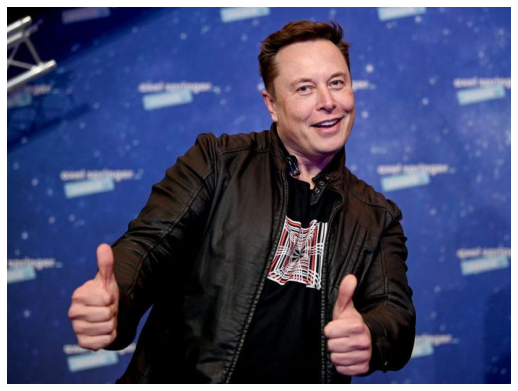

In [45]:
def show(img, size=7):
    plt.figure(figsize=(size, size))
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

elon = cv2.imread("elon_thumbs.jpeg")
show(elon)

Вы решили создать свою Self-Driving-Cars компанию.

Одной из самых главных задач в данном случае  -- это определять, что находится вокруг машины. Для этого необходимо применить методы компьютерного зрения, а именно решить задачу Object Detection. 

Измерьте качество определения объектов по датасету:

https://bdd-data.berkeley.edu/

с помощью двух алгоритмов и сравните их качество.

In [115]:
COCO_CLASSES = [
    "__background__", "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat", "traffic light",
    "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear",
    "zebra", "giraffe", "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball",
    "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup", "fork",
    "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
    "chair", "couch", "potted plant", "bed", "dining table", "toilet", "tv", "laptop", "mouse", "remote", "keyboard", "cell phone",
    "microwave", "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"
]

In [29]:
class BddImageDataset(Dataset):
    labels_file = "labels.json"
    image_key = "name"
    labels_key = "labels"
    category_key = "category"
    box_key = "box2d"
    box_coords = ["x1", "y1", "x2", "y2"]

    def __init__(self, path: str, holdout: str):
        super().__init__()
        self._holdout_path = os.path.join(path, holdout)
        with open(os.path.join(path, self.labels_file), "r") as json_file:
            self._labels = json.load(json_file)

    def __getitem__(self, item):
        image = cv2.imread(os.path.join(self._holdout_path, self._labels[item][self.image_key]))
        labels = self._labels[item][self.labels_key]
        boxes = [tuple([item[self.box_key][f] for f in self.box_coords]) for item in labels if self.box_key in item]
        categories = [item[self.category_key] for item in labels if self.box_key in item]
        return image, boxes, categories

In [99]:
class2color = {}

# Adopt from https://github.com/ultralytics/yolov5/blob/master/utils/plots.py#L71
def plot_boxes(image, boxes, labels, line_thickness=3):
    # Plots one bounding box on image 'im' using OpenCV
    assert image.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    image = image.copy()
    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    for box, label in zip(boxes, labels):
        if label not in class2color:
            class2color[label] = list(np.random.random(size=3) * 256)
        color = class2color[label]
        c1, c2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
        cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    return image

In [49]:
bdd_val_dataset = BddImageDataset("bdd100k", "val")

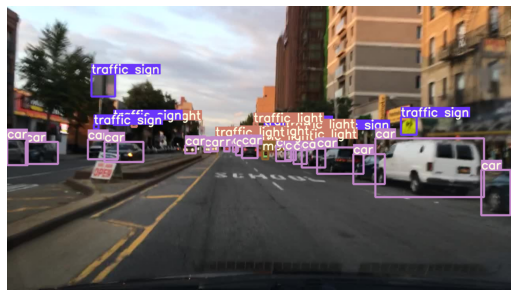

In [121]:
image, boxes, labels = bdd_val_dataset[0]
boxed_image = plot_boxes(image, boxes, labels)
show(boxed_image)

In [51]:
yolo_model = torch.hub.load('ultralytics/yolov5', 'yolov5m', pretrained=True).eval()
faster_rcnn_model = fasterrcnn_resnet50_fpn(pretrained=True).eval()

Using cache found in /Users/Egor.Spirin/.cache/torch/hub/ultralytics_yolov5_master
Fusing layers... 
Model Summary: 308 layers, 21356877 parameters, 0 gradients
Adding AutoShape... 
YOLOv5 🚀 2021-5-21 torch 1.8.1 CPU



In [134]:
def show_yolo(model, dataset, n_samples=20):
    images = [dataset[i][0] for i in range(n_samples)]
    with torch.no_grad():
        results = model(images).pandas().xyxy
    for image, result in zip(images, results):
        boxes = result.iloc[:, :4].values
        labels = result.iloc[:, 6].values
        boxed_image = plot_boxes(image, boxes, labels)
        show(boxed_image)

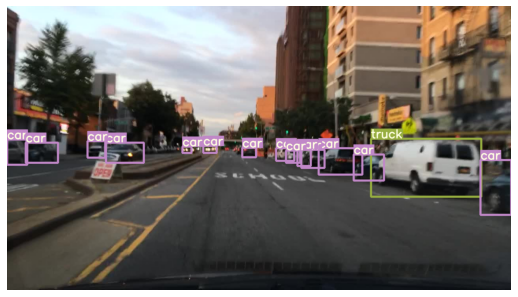

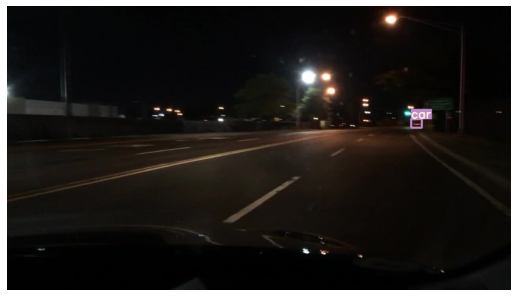

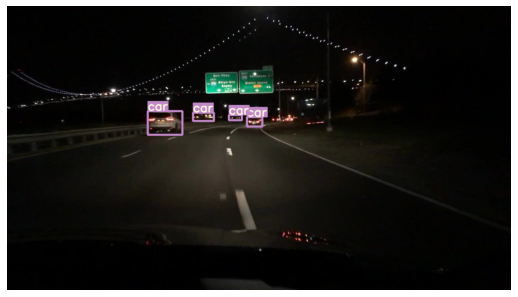

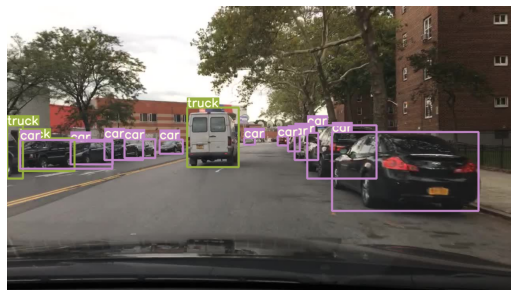

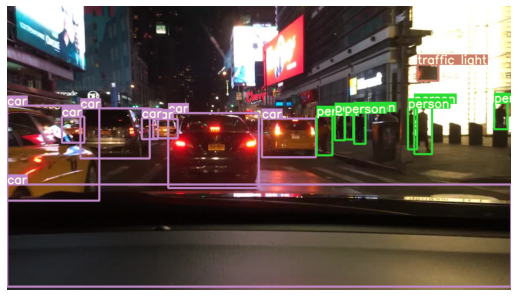

...

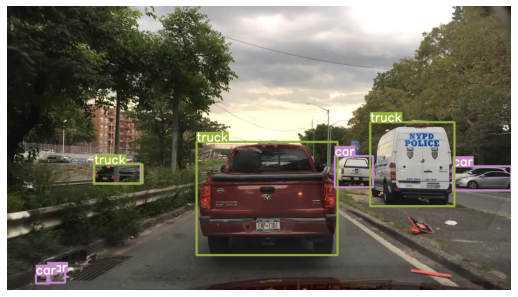

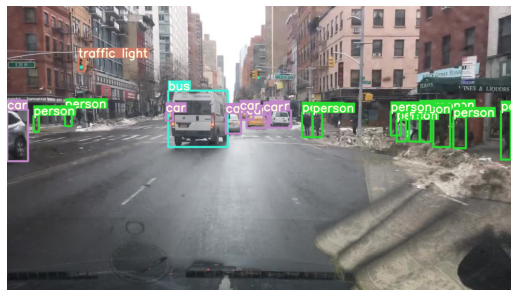

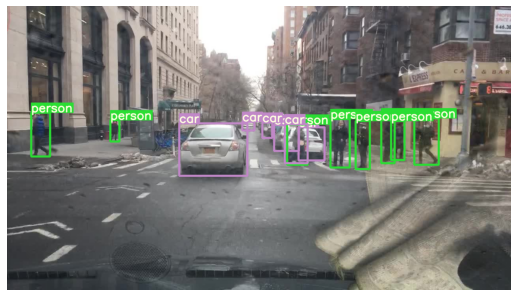

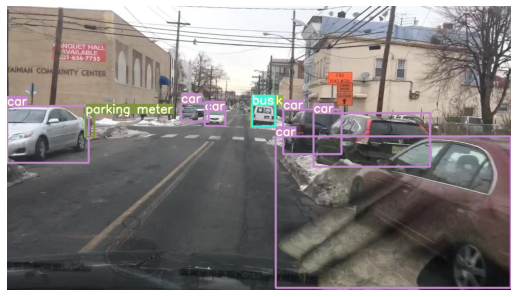

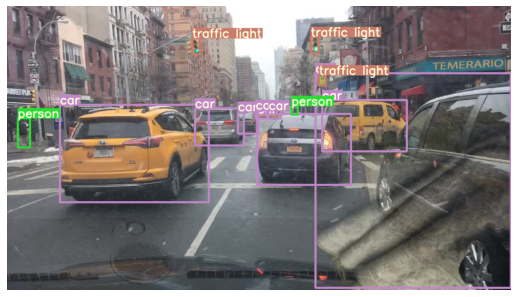

In [101]:
show_yolo(yolo_model, bdd_val_dataset)

In [141]:
def prepare_faster_rcnn_image(image):
    return torch.tensor(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)).permute(2, 0, 1) / 256

def show_faster_rcnn(model, dataset, n_samples=20):
    images = [dataset[i][0] for i in range(n_samples)]
    transformed_images = [prepare_faster_rcnn_image(img) for img in images]
    with torch.no_grad():
        results = model(transformed_images)
    for image, result in zip(images, results):
        boxes, labels = zip(*[
            (box, COCO_CLASSES[i]) for box, i in zip(result["boxes"].detach().numpy(), result["labels"])
            if i < len(COCO_CLASSES)
        ])
        boxed_image = plot_boxes(image, boxes, labels)
        show(boxed_image)

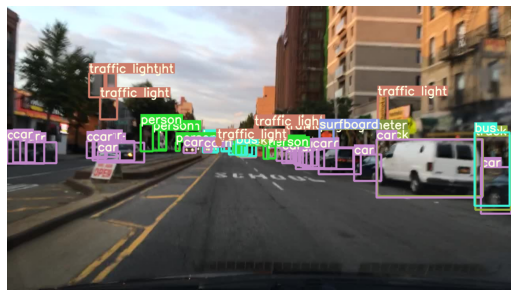

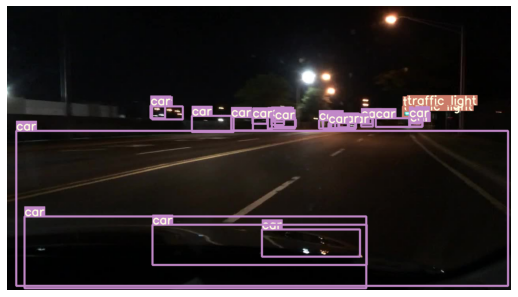

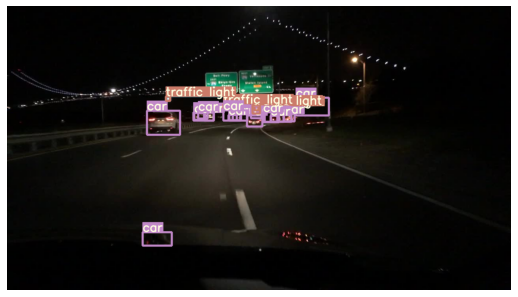

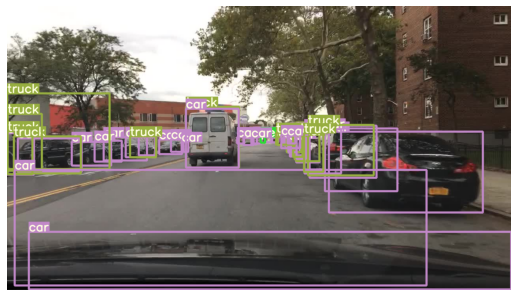

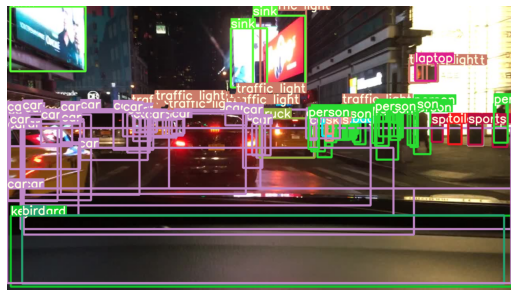

...

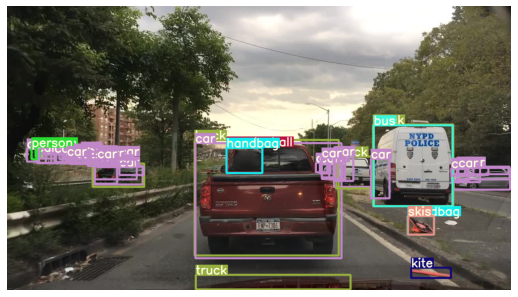

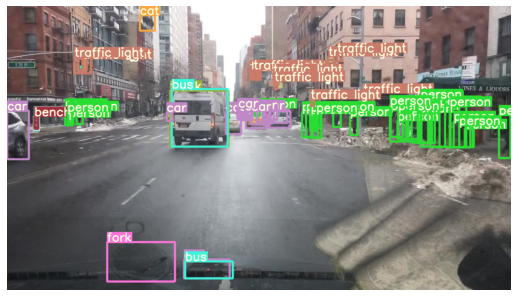

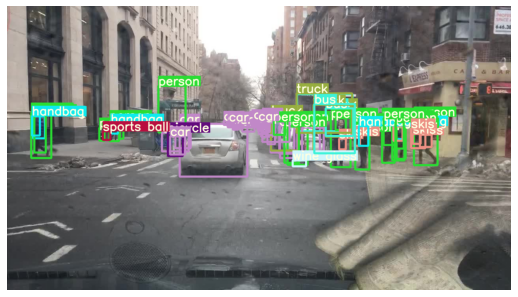

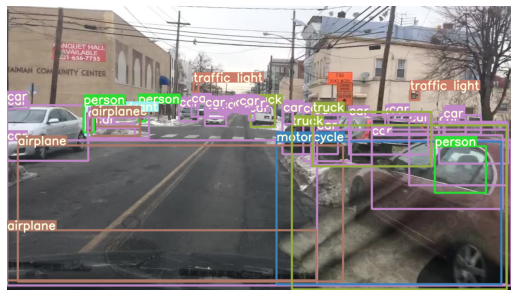

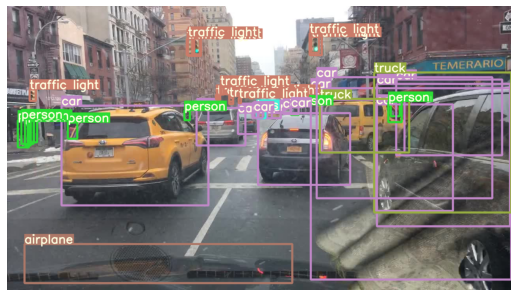

In [143]:
show_faster_rcnn(faster_rcnn_model, bdd_val_dataset)

***2. (10 баллов)***  Проведите сравнение двух рассмотренных алгоритмов с помощью метрик:

В качестве метрик сравнений предлагаются: 

* Detection Rate;
* mAP; 

все метрики для IoU > 0.5

В качестве справки: https://pdfs.semanticscholar.org/d051/ba0a904e4b4c45a2af145aa29b8490bbbc5c.pdf


In [ ]:
# your code here

Всё прошло довольно неплохо и Ваши старания дали плоды. 

Но для улучшения результата Вам нужно собрать данные, оборудование и набрать команду разработчиков. А для этого нужны инвестиции. 

Для привлечения внимания сторонних инвесторов, предлагается пригласить Илона на открытие Вашего первого офиса. Но из короновирусных ограничений Илон не сможет прилететь. А фотография с ним Вам очень нужна. 

***3. (10 баллов)*** Помогите Илону оказаться в Северной столице. Возьмите фото из приложения к домашнему заданию и перместите миллиардера и филантропа на улицу СПБ. Сделайте это двумя способами:

* напрямую методами opencv -- без сегментации;
* с помощью сегментации двумя методами:
        - grabcut;
        - mask r-cnn(например из detectron-a)

In [ ]:
# your code here